In [127]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from ipywidgets import interact, interactive, fixed
%matplotlib inline

### Steps
1. Camera Calibration
2. Distortion Correction
3. Perspective Transformation
4. Color/gradient threshold
5. Detect Lane Lines
6. Determine lane curvature
7. Superimpose lane boundaries
8. Process video

# 1. Camera Calbration:

In [128]:
images = glob.glob("camera_cal/calibration*.jpg")

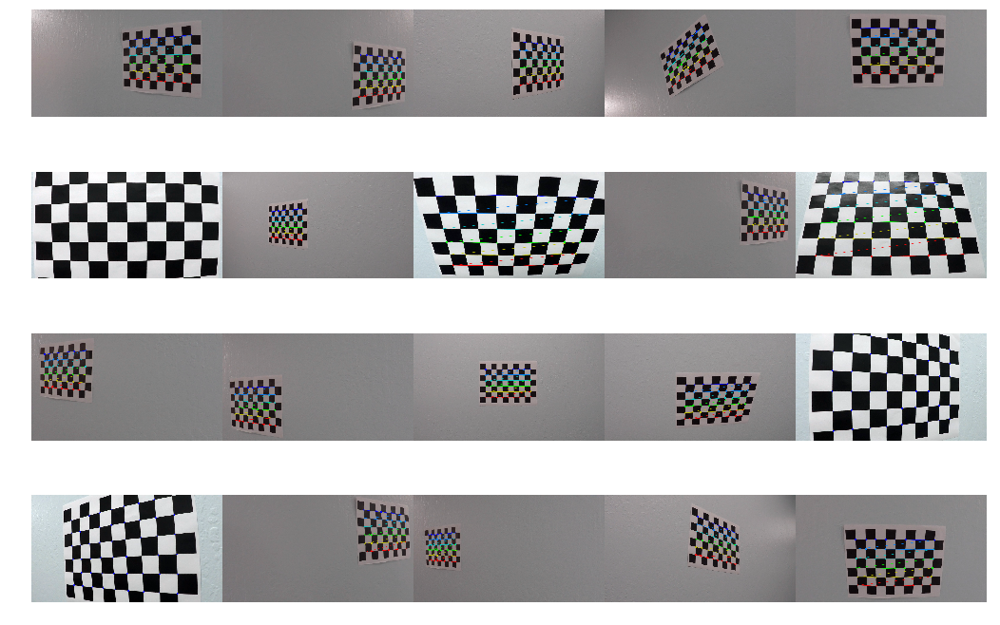

In [129]:
objpoints = []
imgpoints = []
objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
fig, ax = plt.subplots(4,5, figsize=(18, 12))
fig.subplots_adjust(hspace = .2, wspace=.001)
ax = ax.ravel()

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    ax[i].axis('off')
    ax[i].imshow(img)

# 2. Distortion Correction:

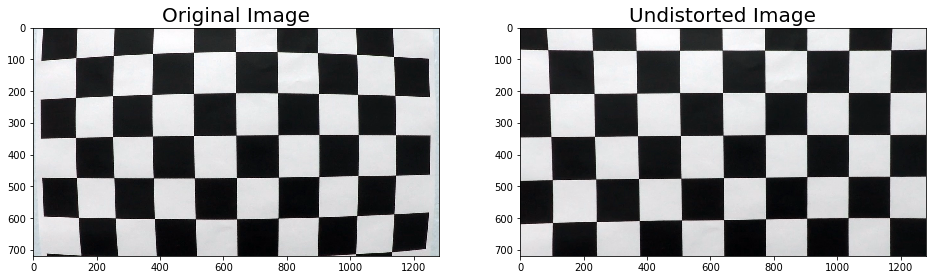

In [130]:
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# Save the camera calibration result in pickle
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=20)

In [131]:
def undistort_img(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [132]:
sample_images = glob.glob("test_images/*.*")
for s_img in sample_images:
    sample_image = cv2.imread(s_img)
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    height,width = sample_image.shape[:2]

### Visualize undistorted images

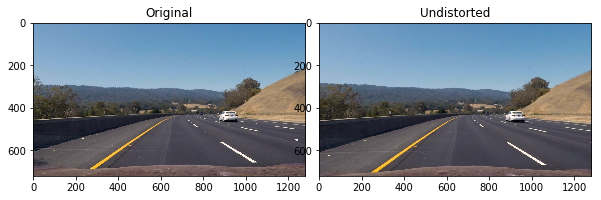

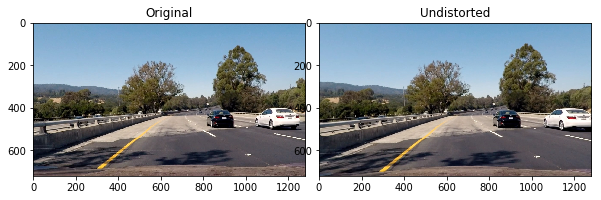

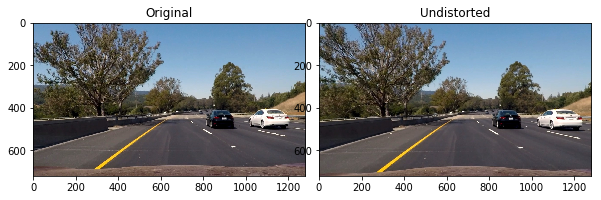

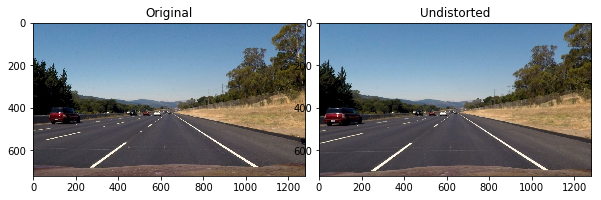

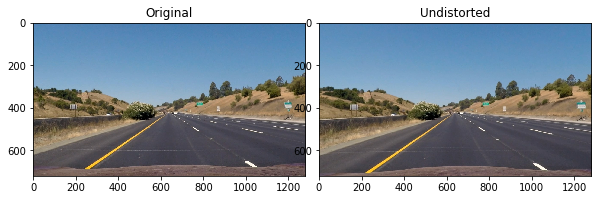

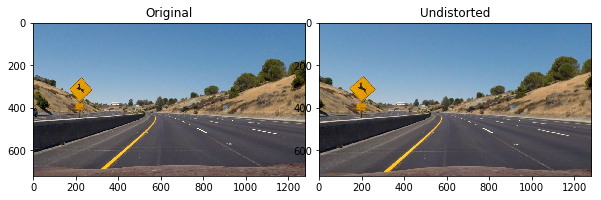

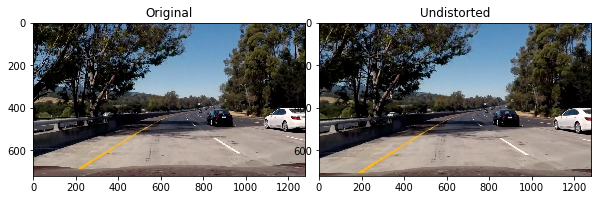

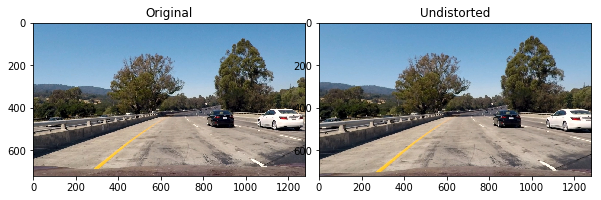

In [133]:
undistorted_images = []

for s_img in sample_images:
    sample_image = cv2.imread(s_img)
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    sample_image_undistorted = undistort_img(sample_image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(sample_image)
    ax1.set_title('Original')
    ax2.imshow(sample_image_undistorted)
    ax2.set_title('Undistorted')
    undistorted_images.append(sample_image_undistorted)

# 3. Perspective Transformation

In [134]:
def corners_unwarp(img, src, dst):
    # Get perspective transform matrix M and the inverse Minv
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (width,height), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

### Image height & width

In [135]:
h,w = img.shape[:2]
print("Hight:", h)
print("Width:", w)

Hight: 720
Width: 1280


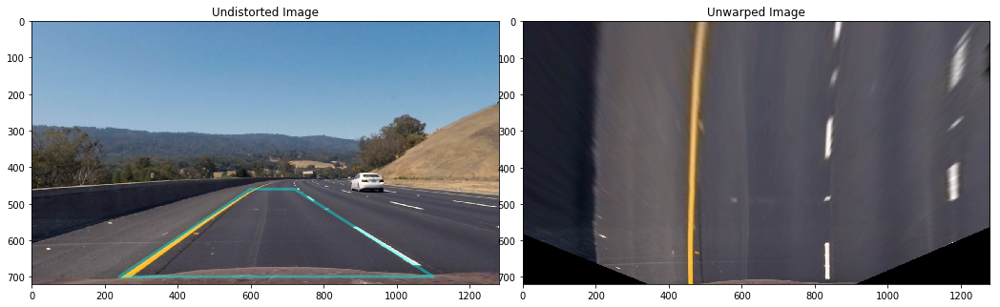

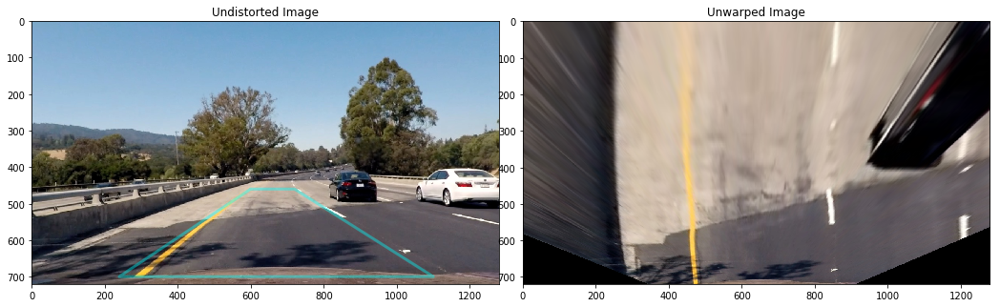

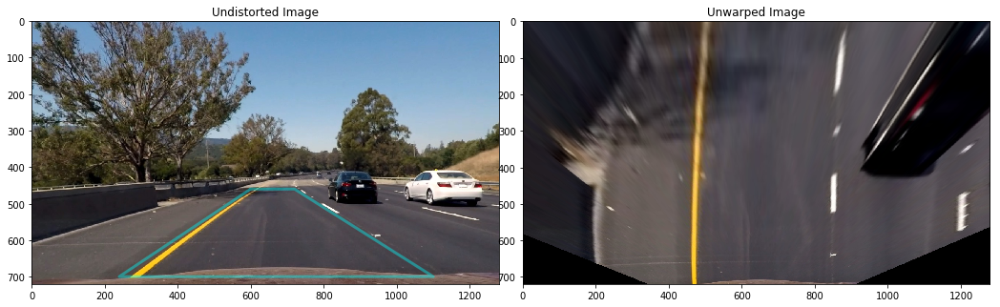

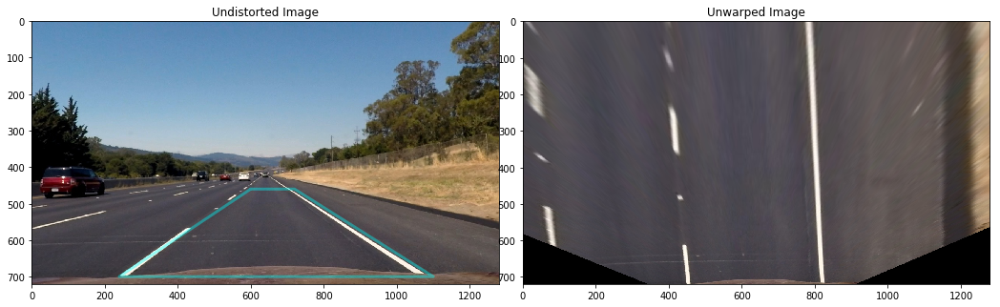

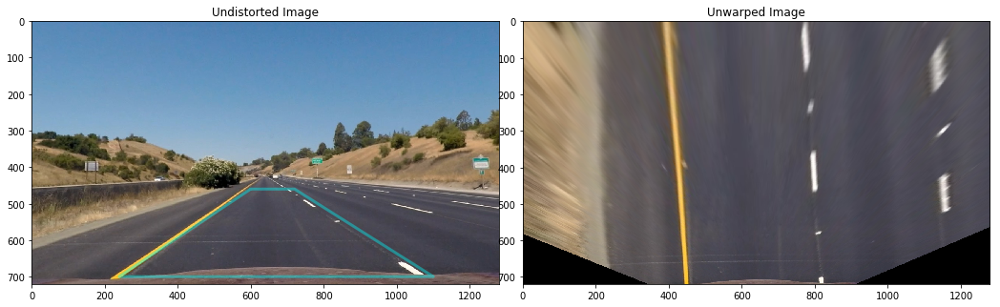

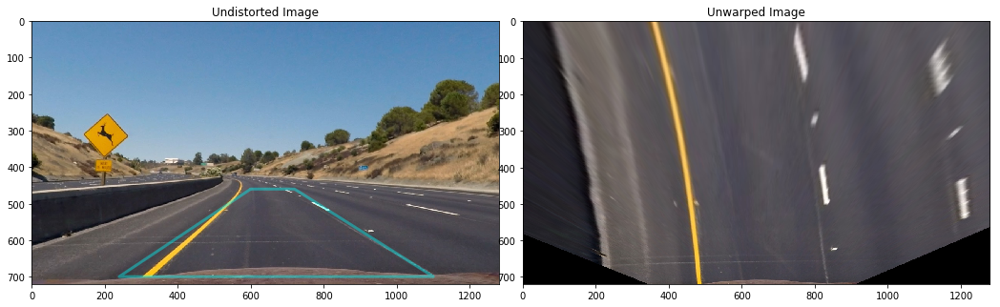

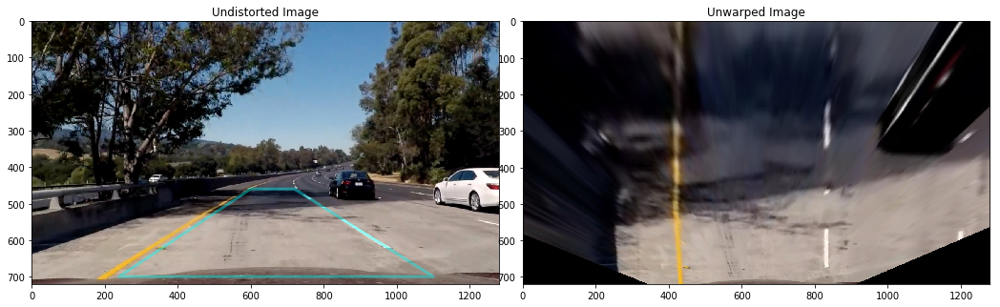

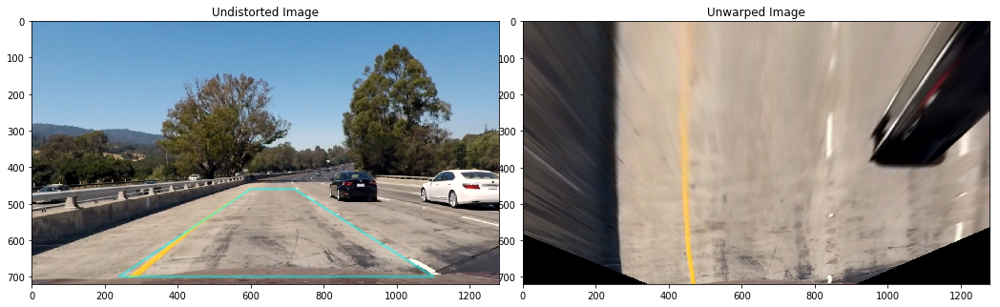

In [136]:
src = np.float32([(600,460),(720,460), (240,700), (1100,700)])
dst = np.float32([(450,0), (830,0), (450,720), (830,720)])

for undist in undistorted_images:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(undist)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='cyan', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    ax1.set_ylim([height,0])
    ax1.set_xlim([0,width])
    ax1.set_title('Undistorted Image')
    sample_image_unwarped, M, Minv = corners_unwarp(undist, src, dst)
    ax2.imshow(sample_image_unwarped)
    ax2.set_title('Unwarped Image')

# 4. Color/gradient threshold

In [137]:
def abs_sobel_thresh(img, sobel_kernel=15, orient='x', thresh=(35, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=15, mag_thresh=(20, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output


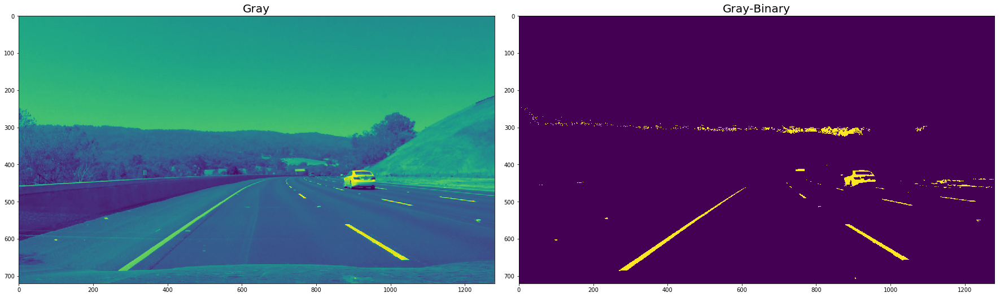

In [138]:
image = test_sample
thresh = (180, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

# Plot Result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gray)
ax1.set_title('Gray', fontsize=20)
ax2.imshow(binary)
ax2.set_title('Gray-Binary', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

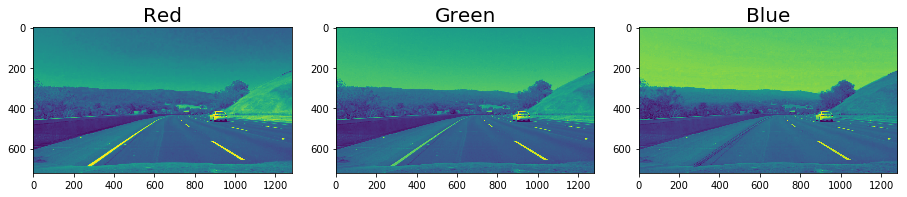

In [139]:
image = test_sample
thresh = (180, 255)

R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

# Plot Result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
f.tight_layout()
ax1.imshow(R)
ax1.set_title('Red', fontsize=20)
ax2.imshow(G)
ax2.set_title('Green', fontsize=20)
ax3.imshow(B)
ax3.set_title('Blue', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

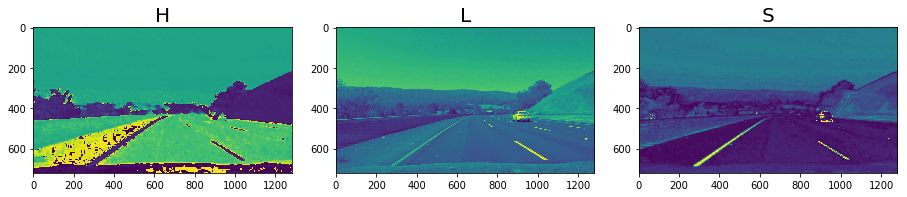

In [140]:
image = test_sample
thresh = (180, 255)

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

# Plot Result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
f.tight_layout()
ax1.imshow(H)
ax1.set_title('H', fontsize=20)
ax2.imshow(L)
ax2.set_title('L', fontsize=20)
ax3.imshow(S)
ax3.set_title('S', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

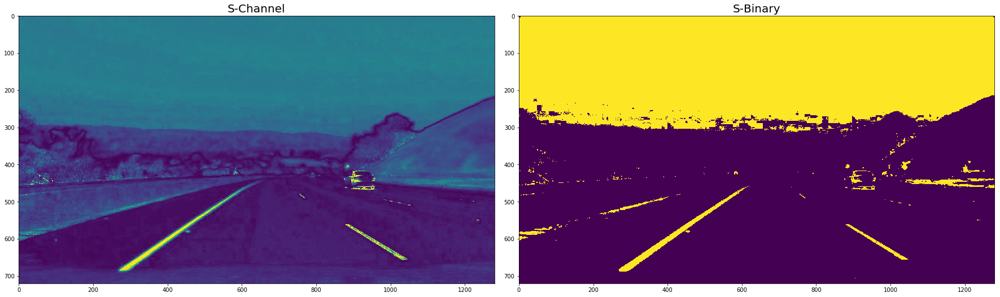

In [141]:
image = test_sample
thresh = (90, 255)

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
#H = hls[:,:,0]
#L = hls[:,:,1]
S = hls[:,:,2]

binary = np.zeros_like(S)
binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# Plot Result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(S)
ax1.set_title('S-Channel', fontsize=20)
ax2.imshow(binary)
ax2.set_title('S-Binary', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [142]:
def HLS_S_threshold(img, thresh=(180, 220)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_s = hls[:,:,2]
    hls_s = hls_s*(255/np.max(hls_s))
    binary_output = np.zeros_like(hls_s)
    binary_output[(hls_s > thresh[0]) & (hls_s <= thresh[1])] = 1
    return binary_output

In [143]:
def hls_lthresh(img, thresh=(220, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # Apply threshold
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # Return binary image
    return binary_output

In [144]:
def labThreshold(img, thresh=(190,255)):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # Apply threshold
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # Return binary image
    return binary_output

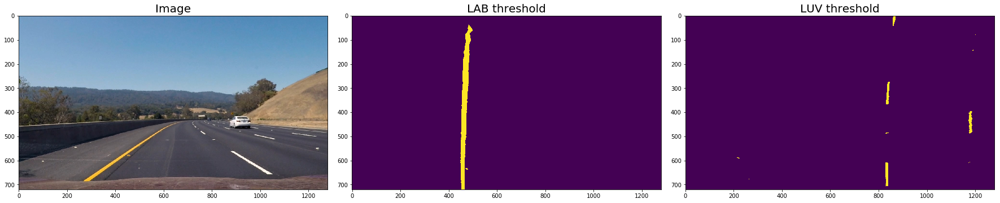

In [145]:
# Visualizing the LAB and LUV
image = test_sample
img_undistort = undistort_img(image)
img_unwarp, M, Minv = corners_unwarp(img_undistort, src, dst)

img_Luv = luvThreshold(img_unwarp)
img_Lab = labThreshold(img_unwarp)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Image', fontsize=20)
ax2.imshow(img_Lab)
ax2.set_title('LAB threshold', fontsize=20)
ax3.imshow(img_Luv)
ax3.set_title('LUV threshold', fontsize=20)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

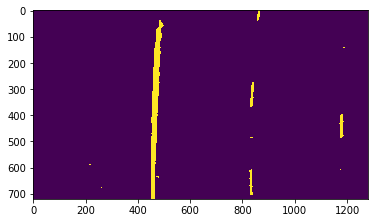

In [146]:
# Combining LAB and LUV
combined = np.zeros_like(img_Lab)
combined[(img_Luv == 1) | (img_Lab == 1)] = 1
plt.imshow(combined)

In [147]:
def luvThreshold(img, thresh=(210, 255)):
    # Convert to LUV color space
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    # Apply threshold
    binary_output = np.zeros_like(luv)
    binary_output[(luv >= thresh[0]) & (luv <= thresh[1])] = 1
    # Return binary image
    return binary_output

In [84]:
def pipeline(image):
    ksize = 15
    img_undistort = undistort_img(image)
    img_unwarp, M, Minv = corners_unwarp(img_undistort, src, dst)
    
    # Tried sobel threshold, HLS, LAB abd LUV. Used a combination of LAB and LUV for the pipeline for the best results 
    
    #gradx = abs_sobel_thresh(img_unwarp, orient='x', sobel_kernel=ksize, thresh=(35, 255))
    #grady = abs_sobel_thresh(img_unwarp, orient='y', sobel_kernel=ksize, thresh=(35, 255))
    #mag_binary = mag_thresh(img_unwarp, sobel_kernel=ksize, mag_thresh=(20, 255))
    #dir_binary = dir_threshold(img_unwarp, sobel_kernel=ksize, thresh=(0, np.pi/2))
    
    img_Luv = luvThreshold(img_unwarp)
    img_Lab = labThreshold(img_unwarp)
    combined = np.zeros_like(img_Lab)
    combined[(img_Luv == 1) | (img_Lab == 1)] = 1
    
    
    return combined, Minv

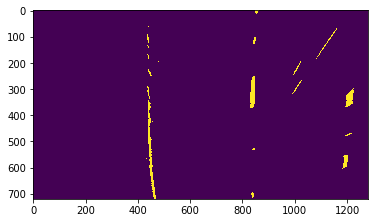

In [148]:
# Visualize birdseye view on test images
B1 = cv2.imread('test_images/test1.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

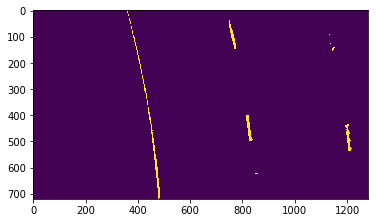

In [149]:
B1 = cv2.imread('test_images/test2.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

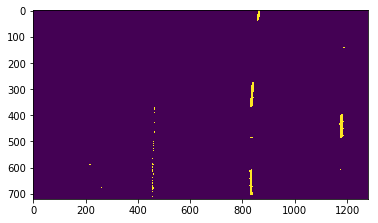

In [150]:
B1 = cv2.imread('test_images/test3.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

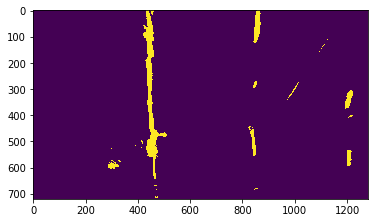

In [151]:
B1 = cv2.imread('test_images/test4.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

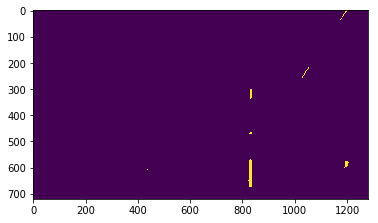

In [152]:
B1 = cv2.imread('test_images/test5.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

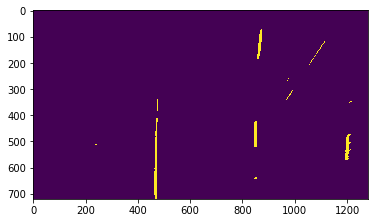

In [153]:
B1 = cv2.imread('test_images/test6.jpg')
S1, Minv1 = pipeline(B1)
plt.imshow(S1)

# 5. Detect Lane Lines

In [154]:
def rectangle_polyfit(img):
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find peak of left and right halves of the histogram, use them as starting points
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    nwindows = 12
    
    # Set height
    window_height = np.int(img.shape[0]/nwindows)
    # x and y positions
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions, updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set width of the windows +/- margin
    margin = 80
    # Set min. number of pixels found to recenter window
    minpix = 40
    # Create empty lists for left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data used for visualization
    rectangle_data = []

    for window in range(nwindows):
        # Determine window boundaries in x and y (& right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        # Determine the nonzero pixels in x and y
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel pos.'s
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    left_fit, right_fit = (None, None)
    
    # Fit second order polynomial for each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

(720, 0)

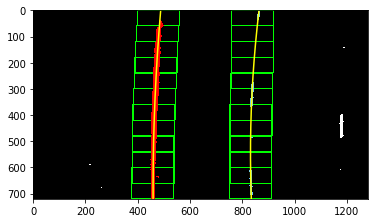

In [155]:
testSample_bin, Minv = pipeline(test_sample)

left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = rectangle_polyfit(testSample_bin)

h = test_sample.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create output image to draw on
out_img = np.uint8(np.dstack((testSample_bin, testSample_bin, testSample_bin))*255)
# Calculate x and y values
ploty = np.linspace(0, testSample_bin.shape[0]-1, testSample_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Draw windows on the image
for rect in rectangles:
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 3) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 3) 
    
# Identify the x and y positions for non-zero pixels
nonzero = testSample_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(0, 1280)

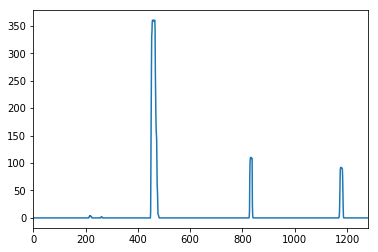

In [156]:
# Plot histogram for the polyfit.
plt.plot(histogram)
plt.xlim(0, 1280)

In [157]:
# Use past_polyfit() to fit polynomial to binary image based on the earlier fit
def past_polyfit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Extract left and right line pixel pos.'s
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit second order polynomial to each of them
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds


(720, 0)

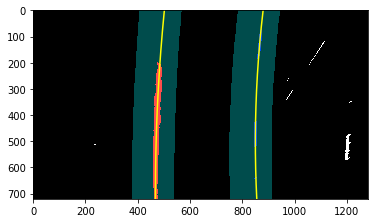

In [158]:
anotherSample = cv2.imread('test_images/test6.jpg')
anotherSample = cv2.cvtColor(anotherSample, cv2.COLOR_BGR2RGB)
anotherSample_bin, Minv = pipeline(anotherSample)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = past_polyfit(anotherSample_bin, left_fit, right_fit)

# Generate x and y values to plot
ploty = np.linspace(0, anotherSample_bin.shape[0]-1, anotherSample_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Generate image to draw on
out_img = np.uint8(np.dstack((anotherSample_bin, anotherSample_bin, anotherSample_bin))*255)
window_img = np.zeros_like(out_img)

# Color left and right line pixels
nonzero = anotherSample_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Create a polygon
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 255))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 255))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# 6. Determine lane curvature

In [162]:
def calculate_curve_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    ym_per_pix = 3.048/100 # meters per pixel in y dimension
    xm_per_pix = 3.7/378 # meters per pixel in x dimension
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions for nonzero pixels
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x and y
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Distance from center = image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist


rad_l, rad_r, d_center = calculate_curve_dist(testSample_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)
print('Radius of curvature      :  ', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center: ', d_center, 'm')

Radius of curvature      :   764.003358583 m, 437.937547488 m
Distance from lane center:  -0.0651586905554 m


# 7. Superimpose lane boudaries

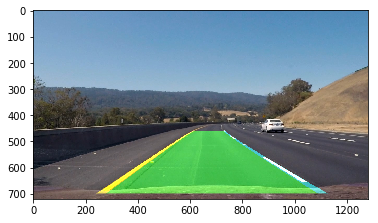

In [163]:
def fill_lane(img, binary_img, l_fit, r_fit, Minv):
    this_img = np.copy(img)
    if l_fit is None or r_fit is None:
        return img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,255,0), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank image to original image space using inverse perspective matrix
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result
    result = cv2.addWeighted(this_img, 1, newwarp, 0.5, 0)
    return result

test_sample_out1 = fill_lane(test_sample, testSample_bin, left_fit, right_fit, Minv)
plt.imshow(test_sample_out1)

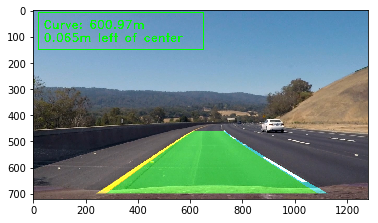

In [164]:
def data_display(img, curv_rad, center_dist):
    this_img = np.copy(img)
    h = this_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve: ' + '{:02.2f}'.format(curv_rad) + 'm'
    cv2.putText(this_img, text, (40,70), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    this_img = cv2.rectangle(this_img, (20,10), (650,150), (0,255,0), 3)
    cv2.putText(this_img, text, (40,120), font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    return this_img

test_sample_out2 = data_display(test_sample_out1, (rad_l+rad_r)/2, d_center)
plt.imshow(test_sample_out2)

In [165]:
def display_lane(img):
    newimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    newimg_bin, Minv = pipeline(newimg)
    l_fit, r_fit, left_lane_inds, right_lane_inds, _ = rectangle_polyfit(newimg_bin)
    paintedLane = fill_lane(newimg, newimg_bin, l_fit, r_fit, Minv)
    rad_l, rad_r, d_center = calculate_curve_dist(newimg_bin, l_fit, r_fit, left_lane_inds, right_lane_inds)
    paintedLaneWithData = data_display(paintedLane, (rad_l+rad_r)/2, d_center)
    
    return paintedLaneWithData

True

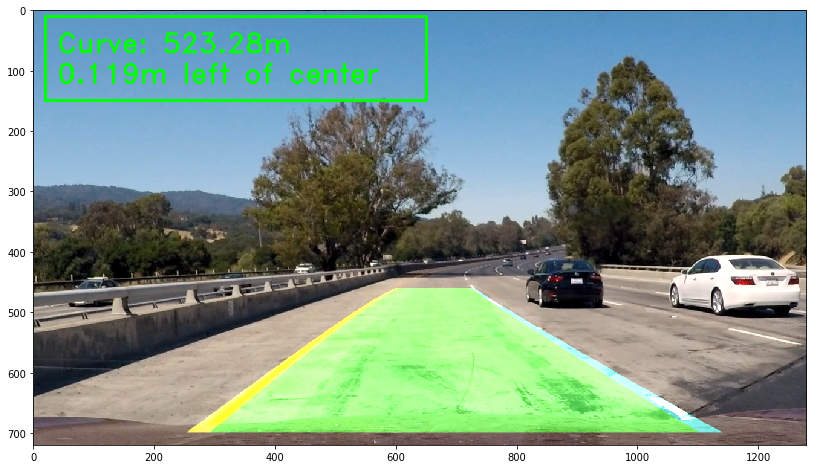

In [166]:
import os
dirname = 'output_images'
# Testing the function on test images
tryImage = cv2.imread('test_images/test1.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)
# Save the image
cv2.imwrite(os.path.join(dirname, "output_test1.jpg"), tryImageLanes)

True

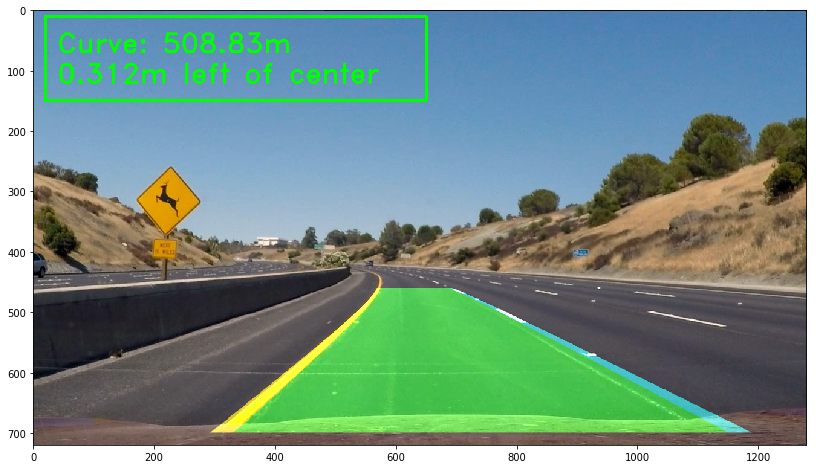

In [167]:
tryImage = cv2.imread('test_images/test2.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)

# Save the image
cv2.imwrite(os.path.join(dirname, "output_test2.jpg"), tryImageLanes)

True

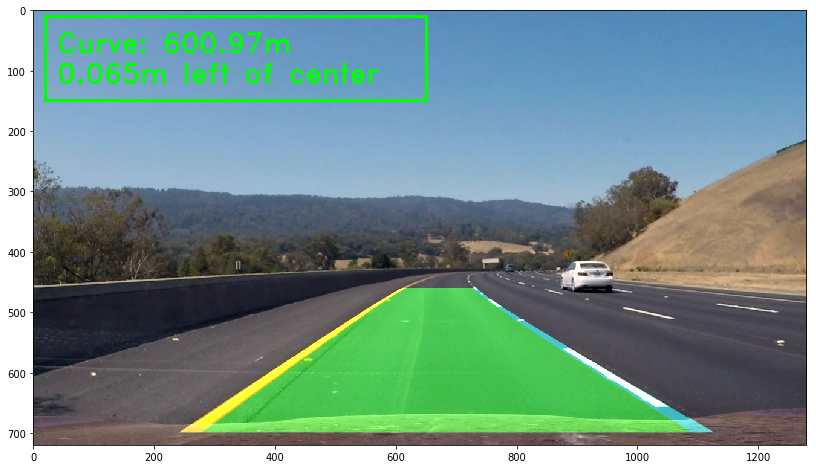

In [168]:
tryImage = cv2.imread('test_images/test3.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)

# Save the image
cv2.imwrite(os.path.join(dirname, "output_test3.jpg"), tryImageLanes)

True

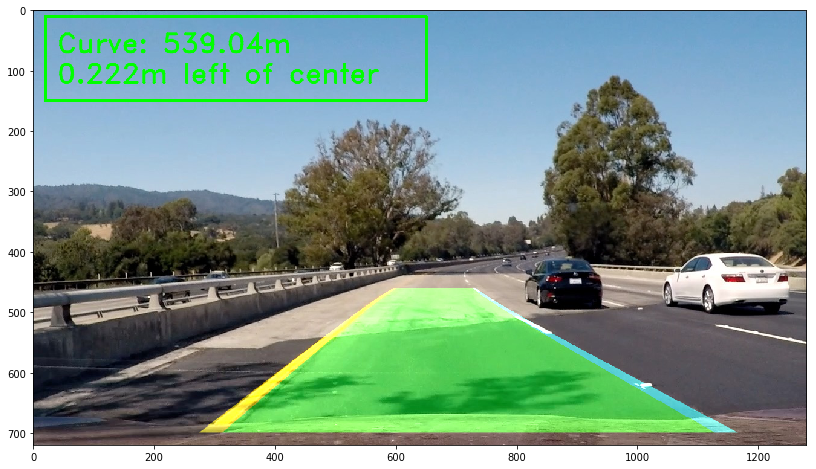

In [169]:
tryImage = cv2.imread('test_images/test4.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)

# Save the image
cv2.imwrite(os.path.join(dirname, "output_test4.jpg"), tryImageLanes)

True

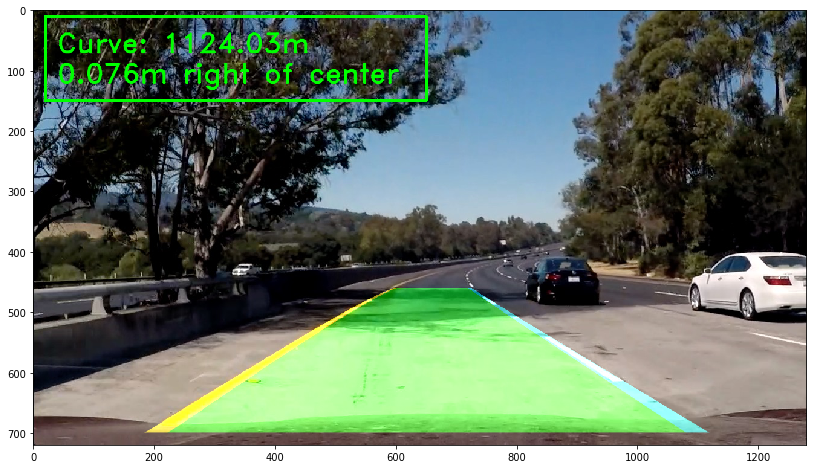

In [170]:
tryImage = cv2.imread('test_images/test5.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)

# Save the image
cv2.imwrite(os.path.join(dirname, "output_test5.jpg"), tryImageLanes)

True

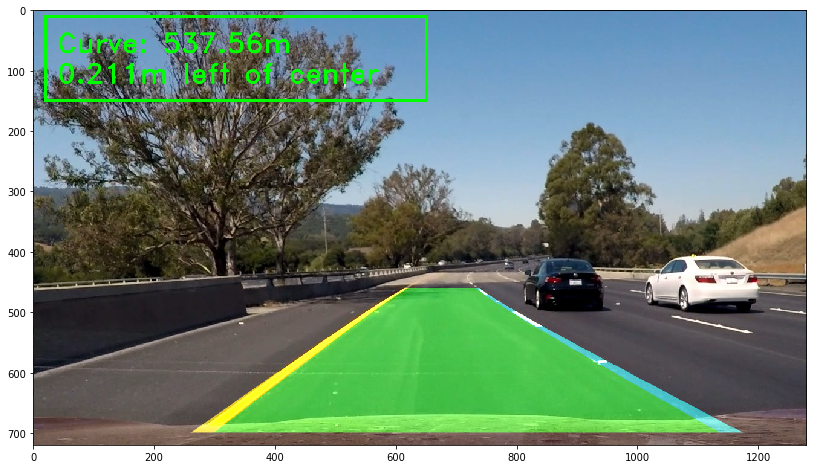

In [171]:
tryImage = cv2.imread('test_images/test6.jpg')
tryImageLanes = display_lane(tryImage)

plt.figure(figsize=(15,8))
plt.imshow(tryImageLanes)

# Save the image
cv2.imwrite(os.path.join(dirname, "output_test6.jpg"), tryImageLanes)

# 8. Process video

In [172]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None

    def append_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)


In [173]:
def process_video(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    
    if not lt_line.detected or not rt_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = rectangle_polyfit(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = past_polyfit(img_bin, lt_line.best_fit, rt_line.best_fit)
        
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    lt_line.append_fit(l_fit, l_lane_inds)
    rt_line.append_fit(r_fit, r_lane_inds)
    
    # Draw current best-fit, if it does exists
    if lt_line.best_fit is not None and rt_line.best_fit is not None:
        img_out1 = fill_lane(new_img, img_bin, lt_line.best_fit, rt_line.best_fit, Minv)
        rad_l, rad_r, d_center = calculate_curve_dist(img_bin, lt_line.best_fit, rt_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = data_display(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
        
    return img_out

# Process Project Video

In [174]:
lt_line = Line()
rt_line = Line()
project_clip_output = 'project_video_output.mp4'
project_clip_input = VideoFileClip('project_video.mp4')     #.subclip(10,20)
processed_video = project_clip_input.fl_image(process_video)
%time processed_video.write_videofile(project_clip_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [11:02<00:00,  2.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 18min 7s, sys: 6.92 s, total: 18min 14s
Wall time: 11min 8s


In [179]:
Video_1 = 'project_video_output.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(Video_1))

# Process Challenge Video

In [175]:
lt_line = Line()
rt_line = Line()
chalange_clip_output = 'challenge_video_output.mp4'
chalange_clip_input = VideoFileClip('challenge_video.mp4')    #.subclip(10,20)
processed_video = chalange_clip_input.fl_image(process_video)
%time processed_video.write_videofile(chalange_clip_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [04:43<00:00,  2.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 6min 58s, sys: 3.6 s, total: 7min 2s
Wall time: 4min 48s


In [181]:
Video_2 = 'challenge_video_output.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(Video_2))

# Process Harder Challenge Video

In [176]:
lt_line = Line()
rt_line = Line()
hardchalange_clip_output = 'harder_challenge_video_output.mp4'
hardchalange_clip_input = VideoFileClip('harder_challenge_video.mp4')#.subclip(0,4)
processed_video = hardchalange_clip_input.fl_image(process_video)
%time processed_video.write_videofile(hardchalange_clip_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [12:35<00:00,  1.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 18min 48s, sys: 7.66 s, total: 18min 56s
Wall time: 12min 44s


In [183]:
Video_3 = 'harder_challenge_video_output.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(Video_3))